## Inspect annotation data for Mask-RCNN pistil detection model training

#### 1. make sure Detectron2 is installed correctly
#### 2. inspect annotation data for maize and setaria training, validation, and testing datasets

In [1]:
#set up
import torch, detectron2
print("detectron2:", detectron2.__version__)

from detectron2.utils.logger import setup_logger
setup_logger()

# import common libraries
import numpy as np
import os, json, cv2, random

# import detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from matplotlib import pyplot as plt

%matplotlib inline

detectron2: 0.6


### Detectron2 testing

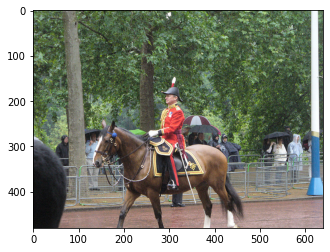

In [2]:
#get a test image
!wget http://images.cocodataset.org/val2017/000000439715.jpg -q -O input.jpg
im = cv2.imread("input.jpg")
plt.imshow(im[:, :, ::-1])
plt.rcParams['figure.figsize'] = [36, 24]
plt.show()

/usr/local/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


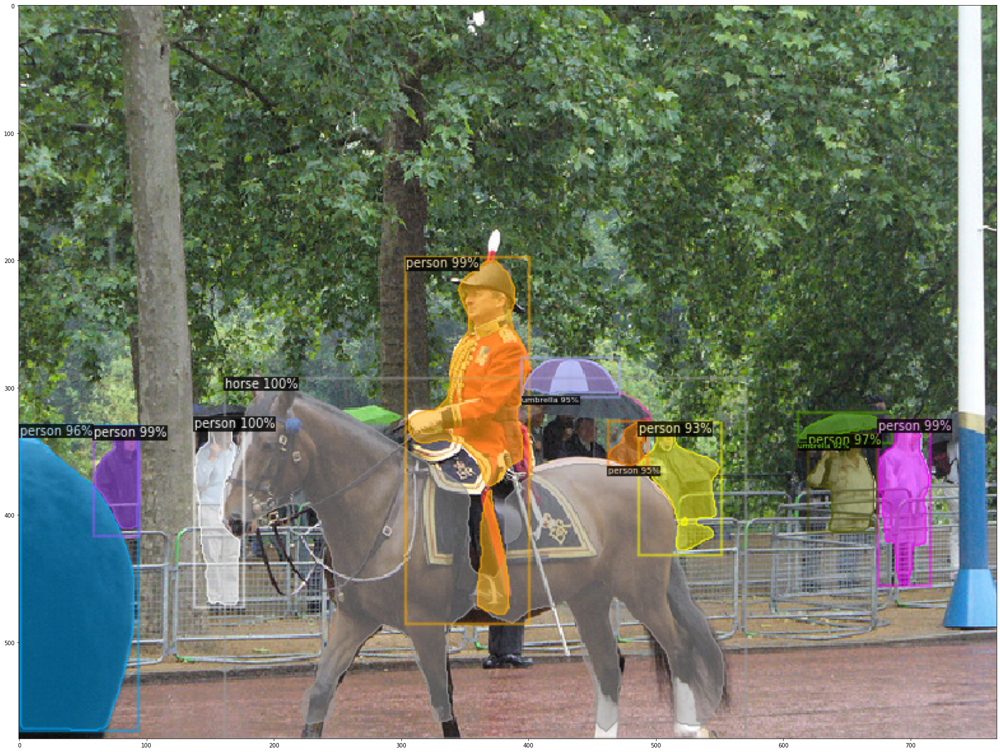

In [3]:
#config
cfg = get_cfg()

#using mask-rcnn base model for testing.
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.DEVICE = 'cpu'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

#run inference on test picture
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.imshow(out.get_image())
plt.rcParams['figure.figsize'] = [36, 24]
plt.show()

### inspect maize and setaria annotations 

In [4]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog

#images annotated with via-annotator and roboflow
#training set w/ 2x augmentations
#register_coco_instances("train_data_all", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/grass_pistil_segmentation.v3i.coco-segmentation/train/_annotations.coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/grass_pistil_segmentation.v3i.coco-segmentation/train")

#validation set
#register_coco_instances("val_data_all", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/grass_pistil_segmentation.v3i.coco-segmentation/valid/_annotations.coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/grass_pistil_segmentation.v3i.coco-segmentation/valid")

#merged test set
#register_coco_instances("test_data_all", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/grass_pistil_segmentation.v3i.coco-segmentation/test/_annotations.coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/grass_pistil_segmentation.v3i.coco-segmentation/test")

#genotype/species-specific test sets
#register_coco_instances("test_tb1gt1ra3", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/tb1gt1ra3_testset_final_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")
#register_coco_instances("test_gt1ra3", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/gt1ra3_testset_final_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")
#register_coco_instances("test_gt1P", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/gt1P_testset_final_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")
#register_coco_instances("test_setaria", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images/setaria_test_coco.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/test_images")

#check stratified k-fold annotations sets
register_coco_instances("fold1_train", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/stratifiedKfoldGen/annotations/fold_1/train.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/stratifiedKfolds")
register_coco_instances("fold2_val", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/stratifiedKfoldGen/annotations/fold_2/val.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/stratifiedKfolds")
register_coco_instances("fold3_train", {}, "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/stratifiedKfoldGen/annotations/fold_3/train.json", "/work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/annotations/stratifiedKfolds")



[04/03 21:37:14 d2.data.datasets.coco]: Loaded 433 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/stratifiedKfoldGen/annotations/fold_1/train.json


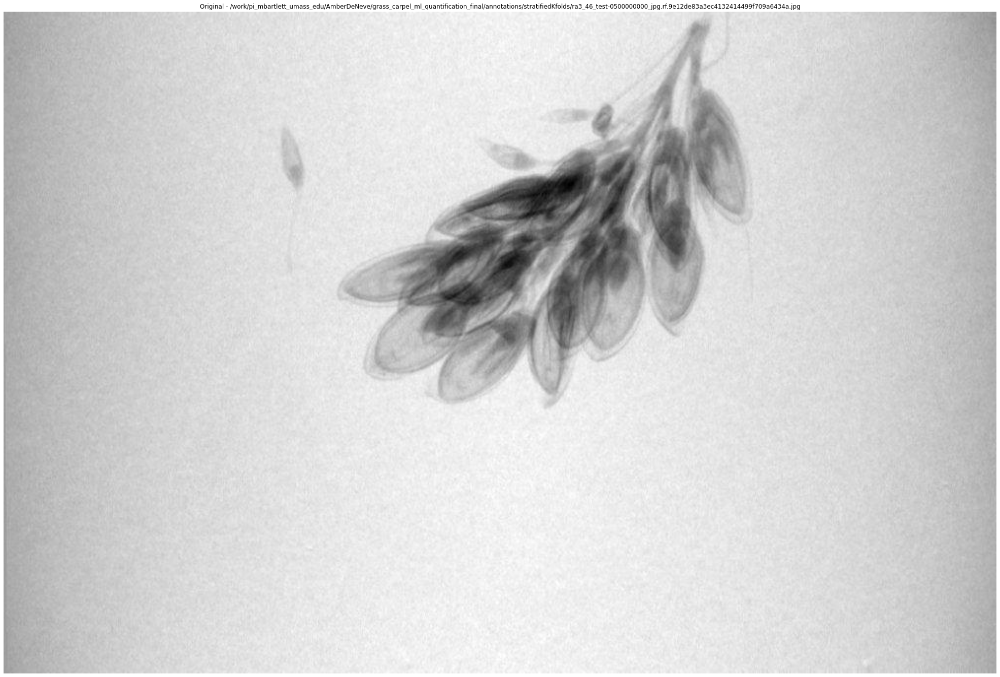

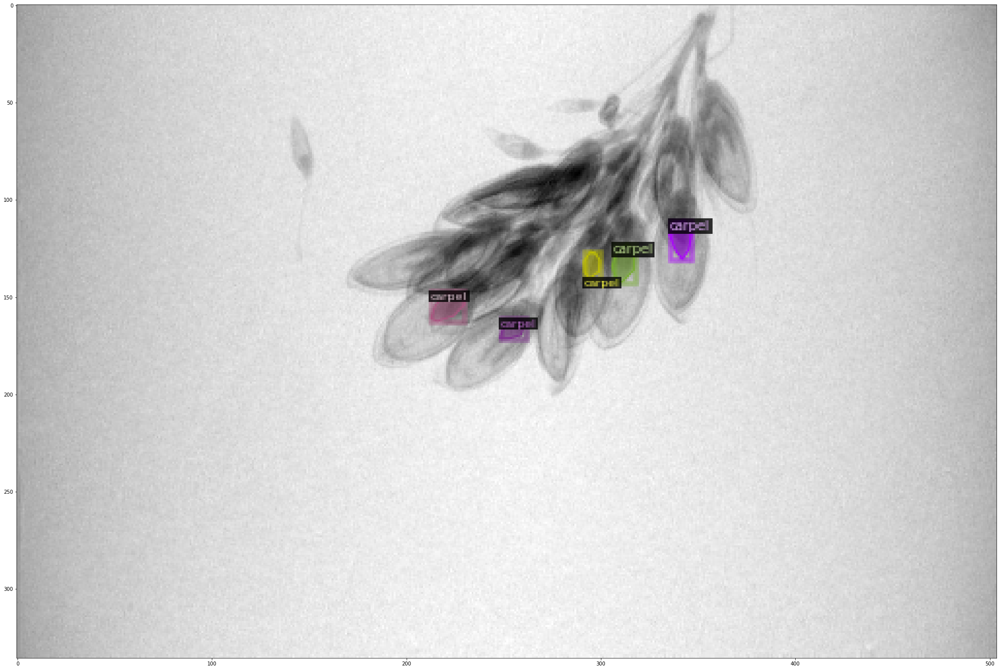

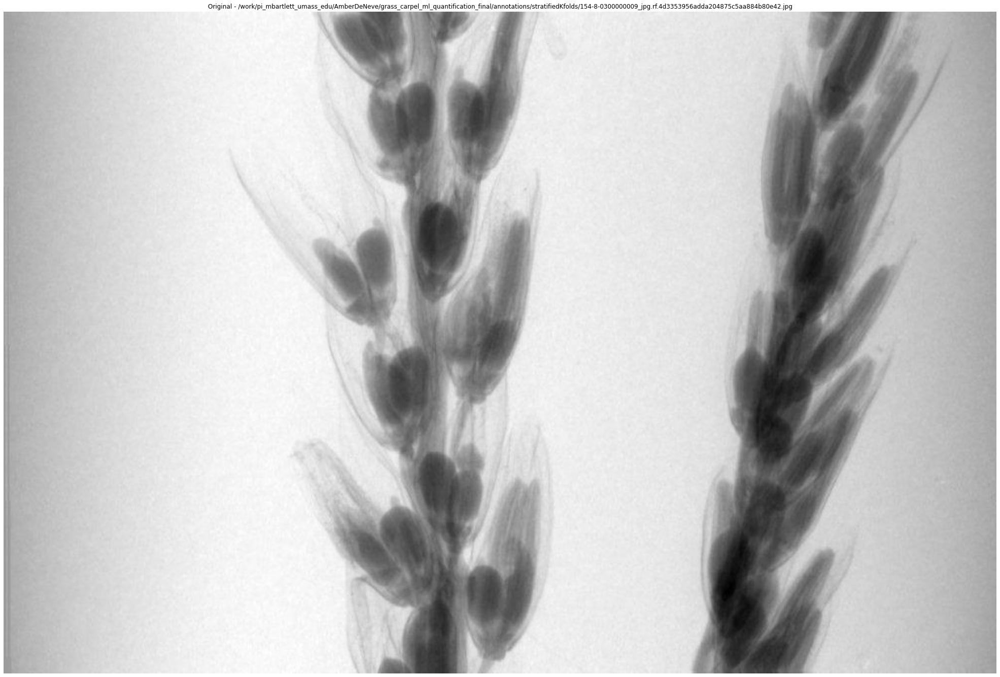

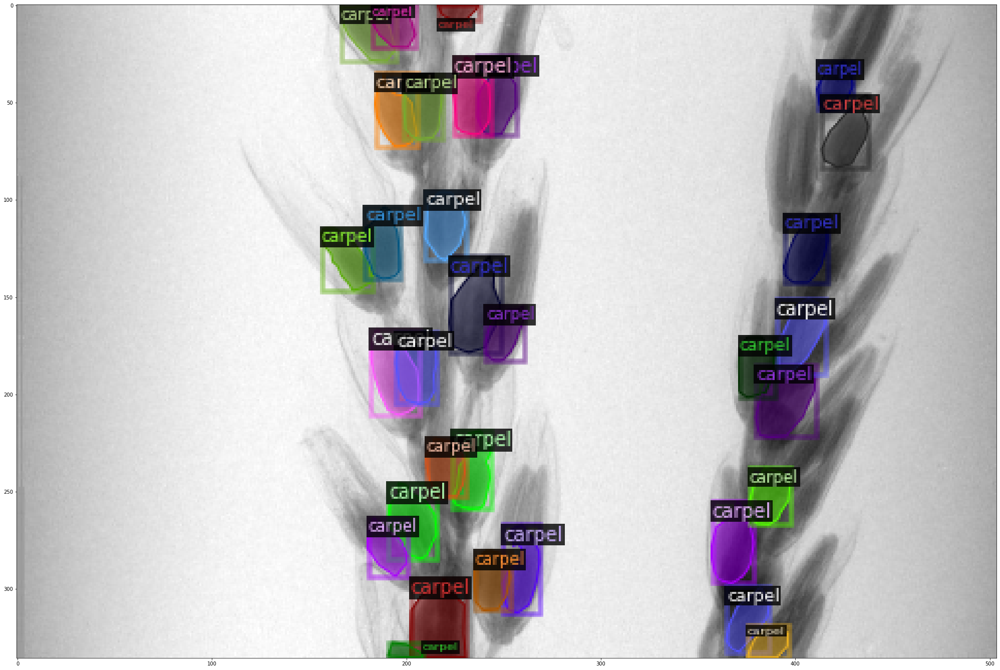

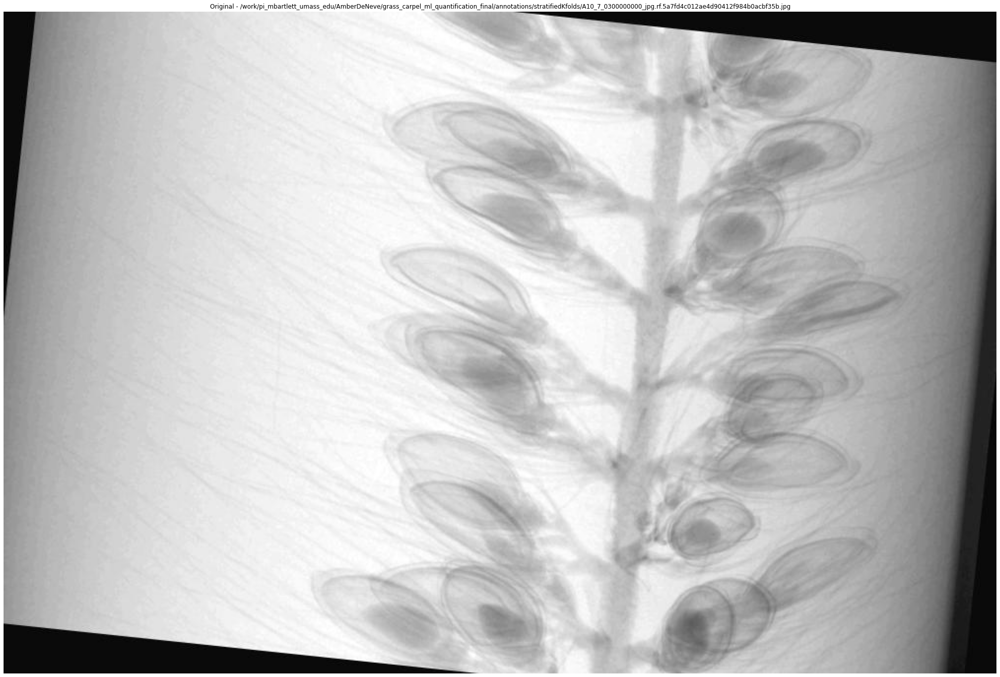

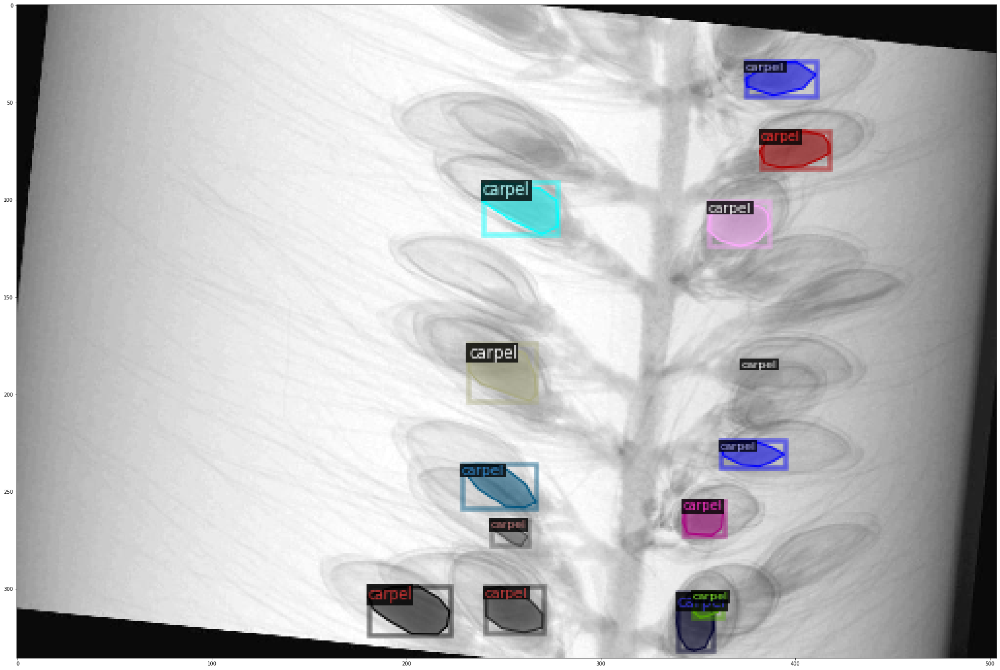

[04/03 21:37:19 d2.data.datasets.coco]: Loaded 108 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/stratifiedKfoldGen/annotations/fold_2/val.json


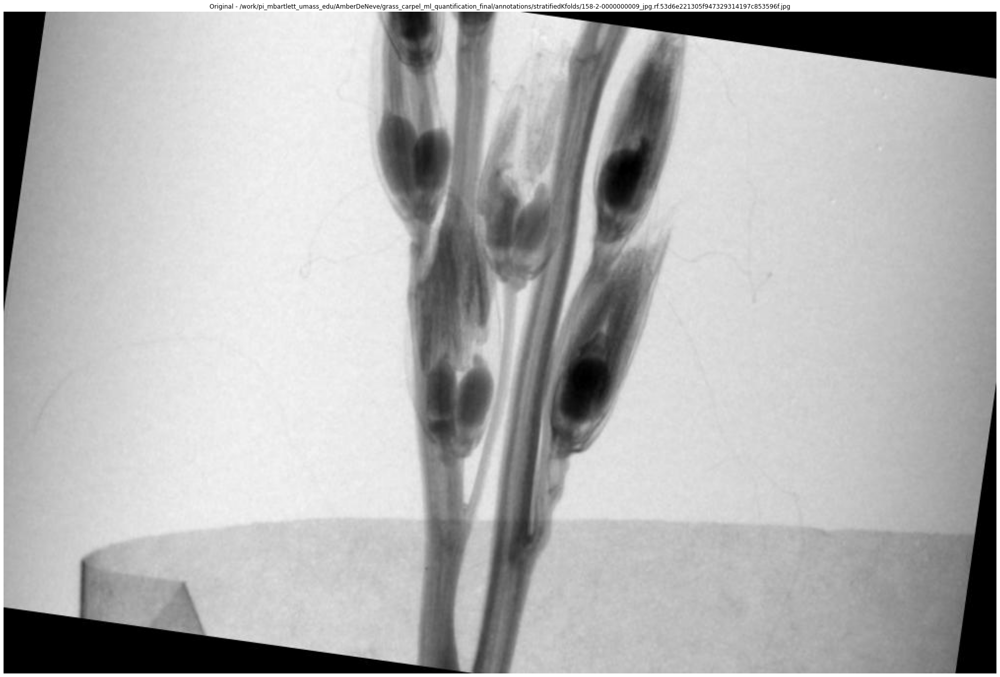

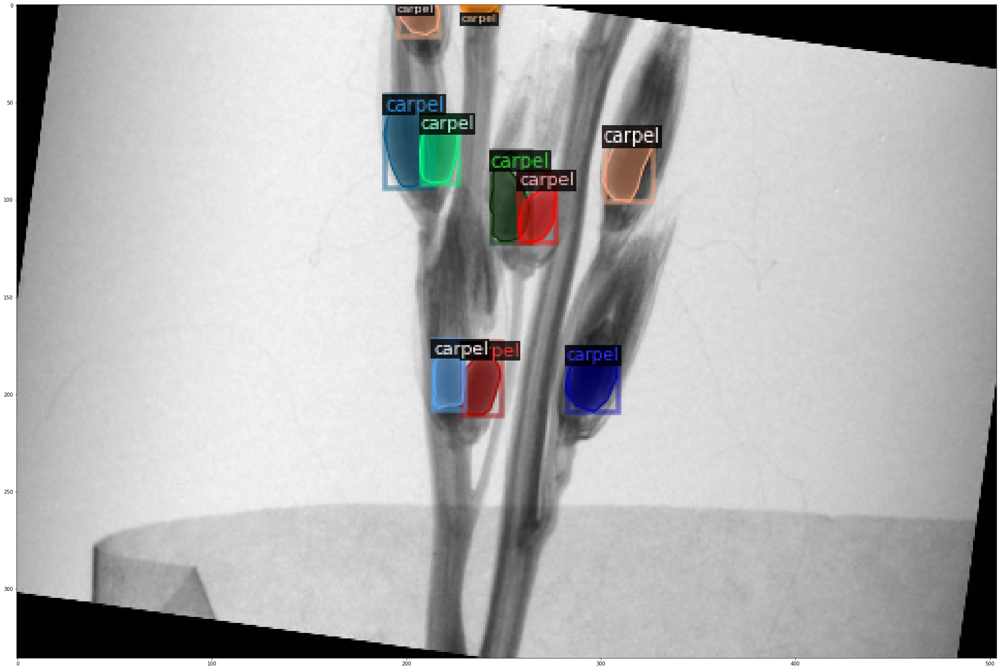

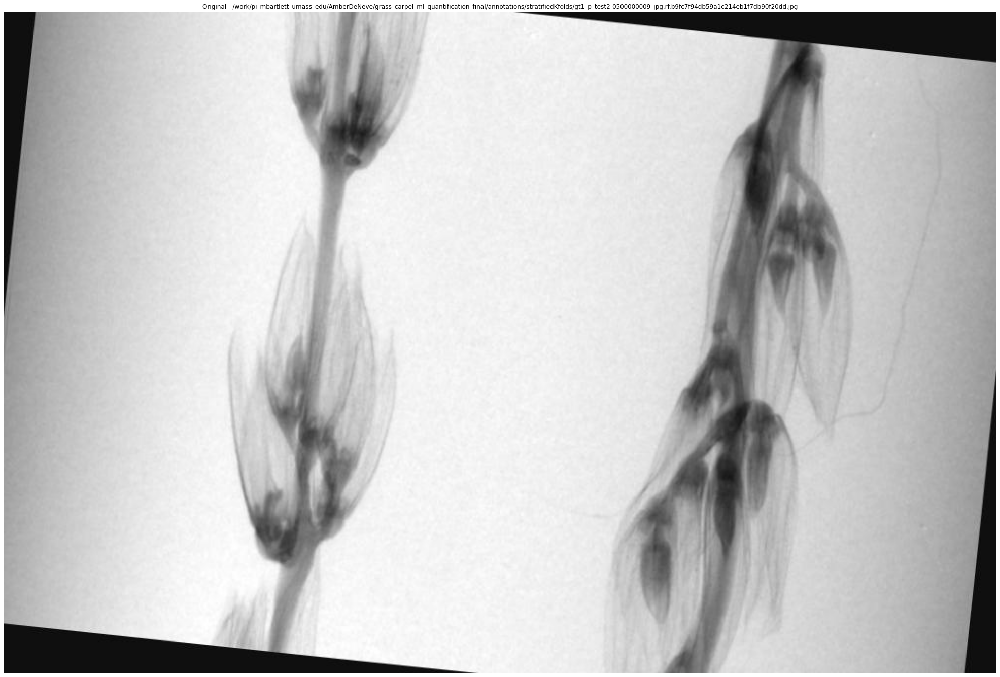

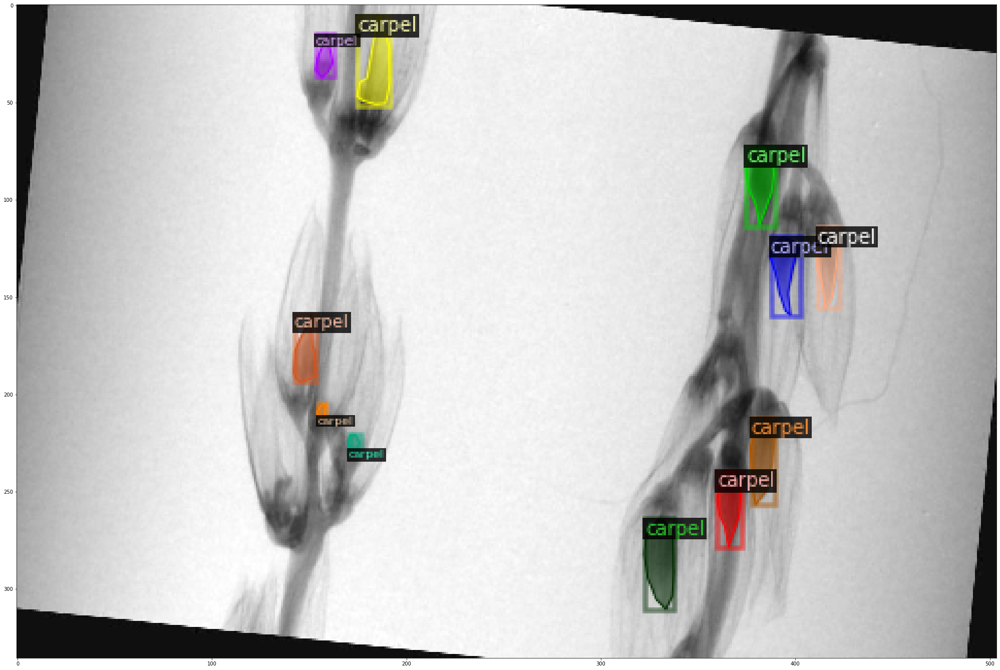

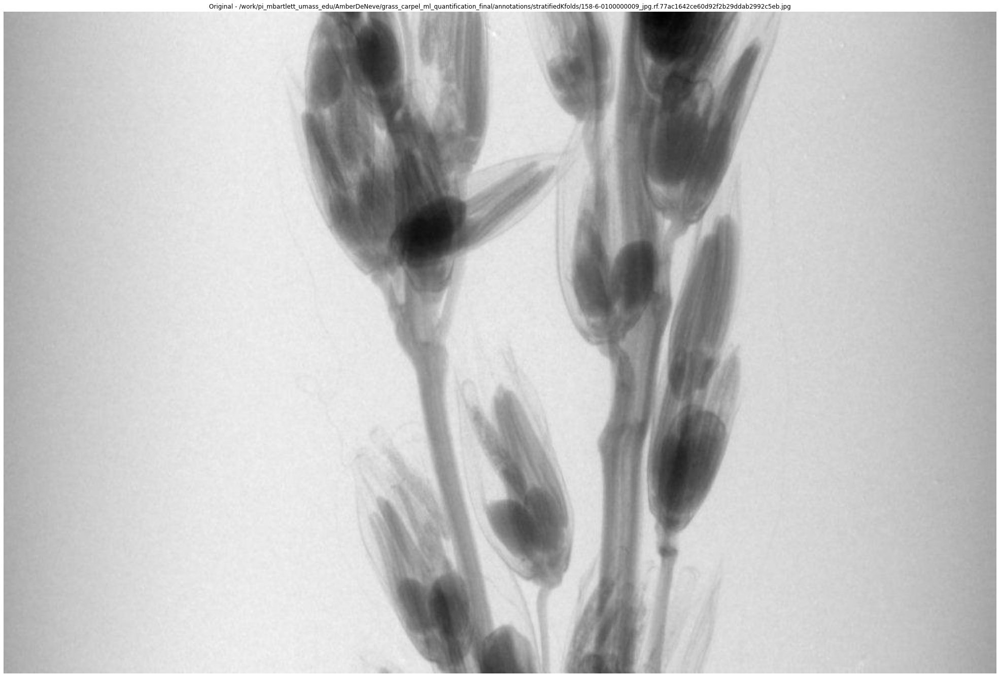

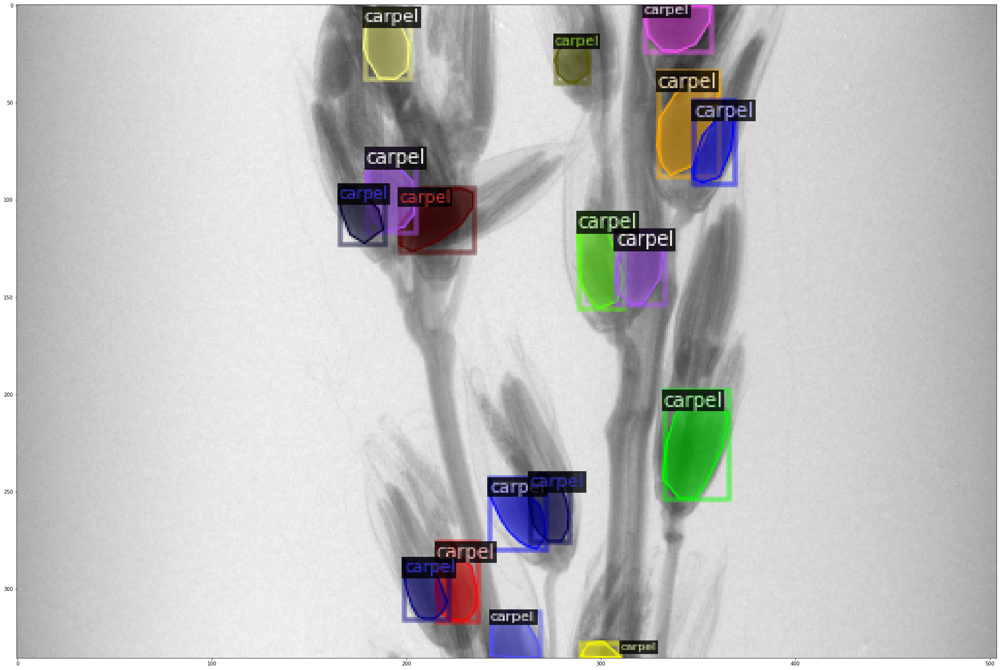

[04/03 21:37:24 d2.data.datasets.coco]: Loaded 434 images in COCO format from /work/pi_mbartlett_umass_edu/AmberDeNeve/grass_carpel_ml_quantification_final/stratifiedKfoldGen/annotations/fold_3/train.json


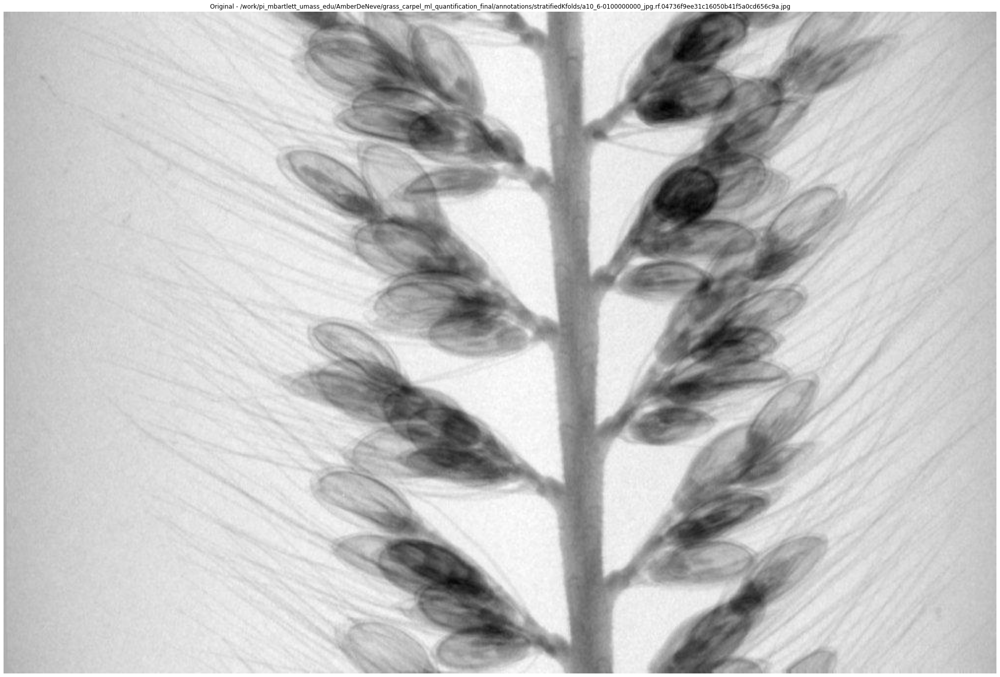

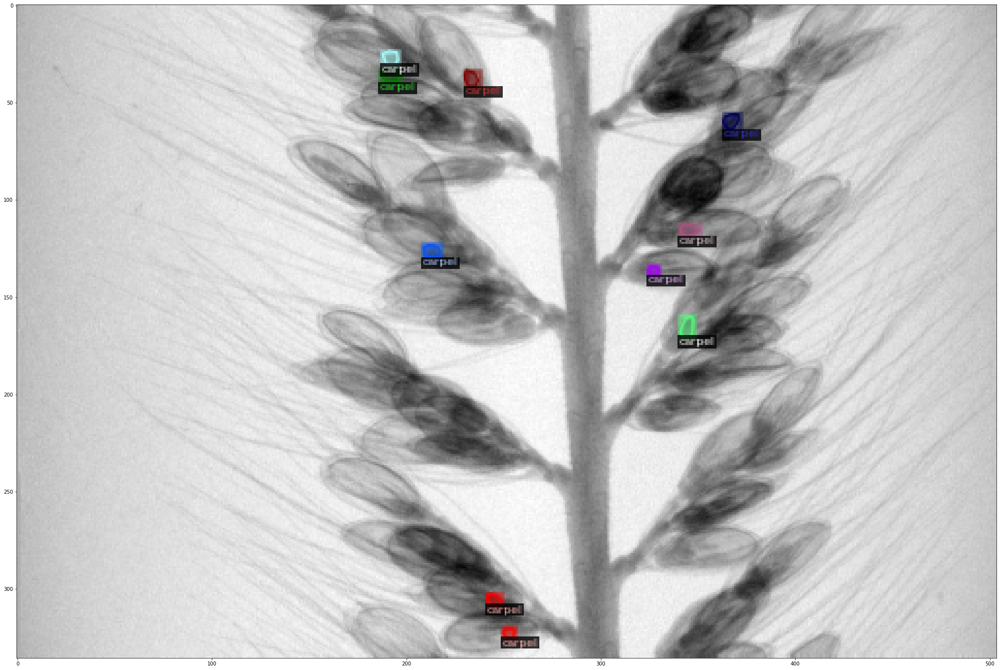

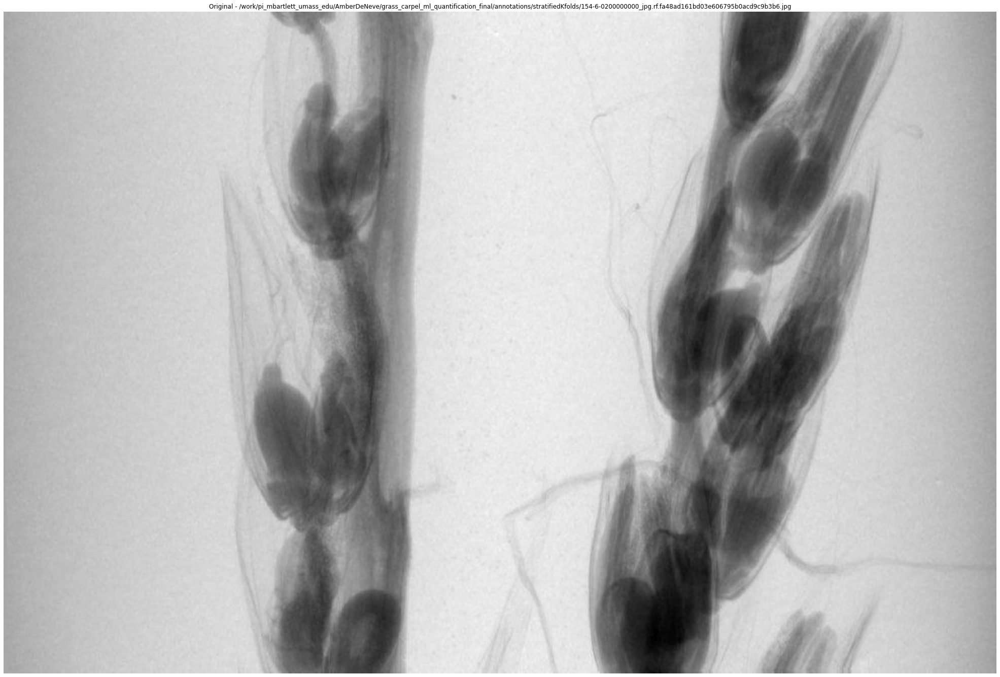

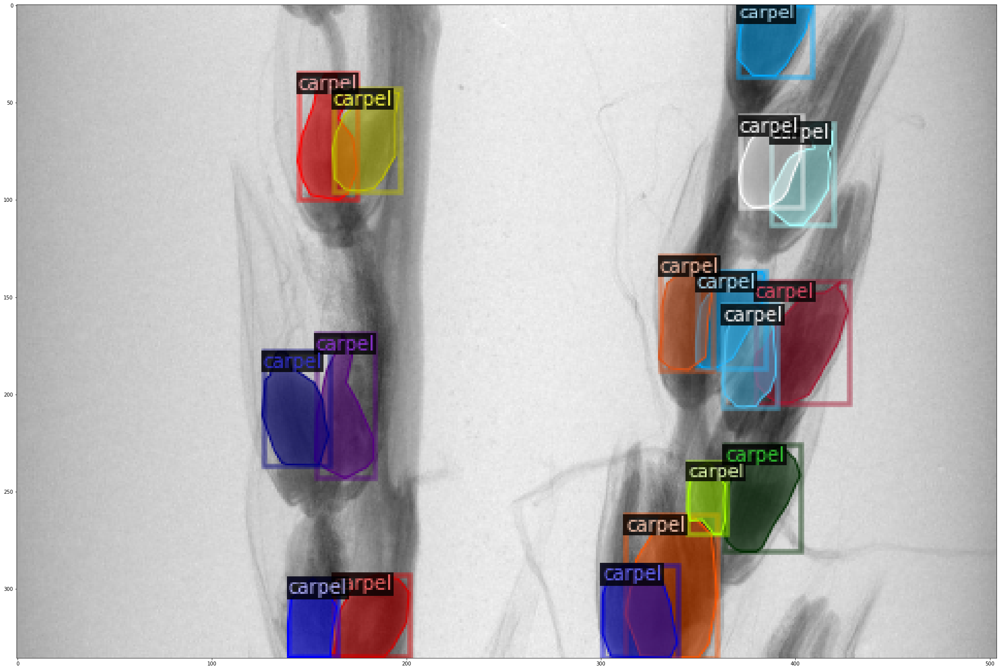

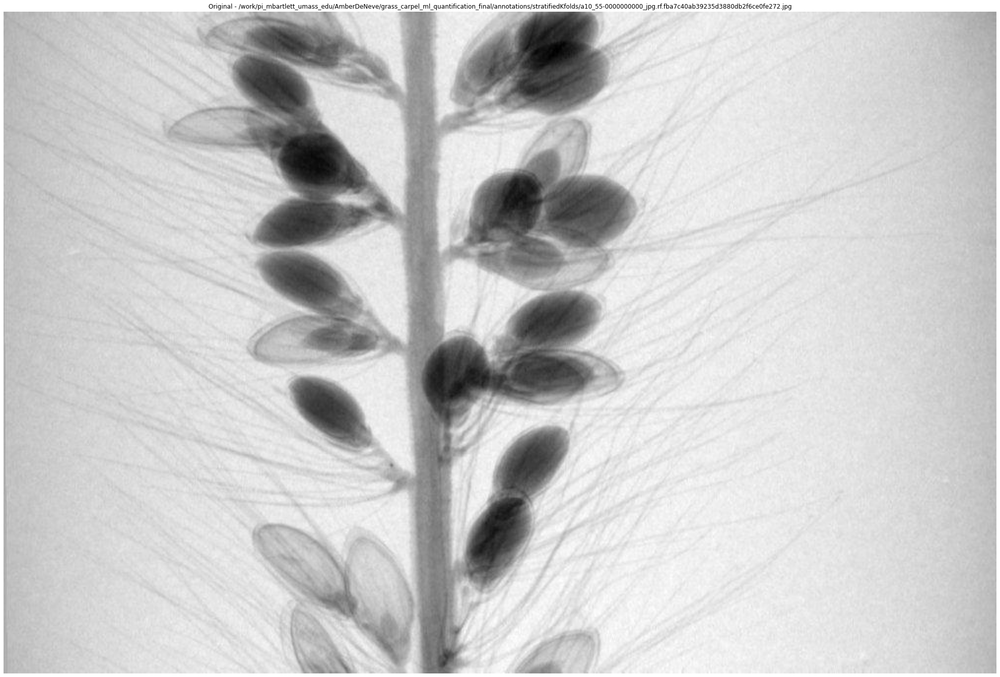

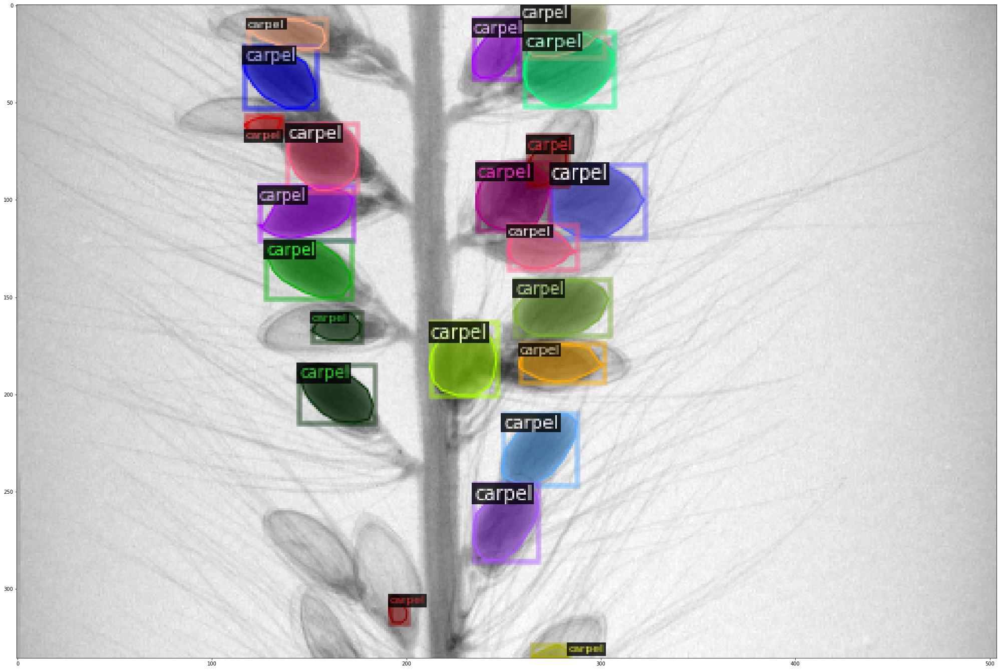

In [22]:
#check annotations for 3 random images from each annotation set
import random
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

#datasets=["train_data_all","val_data_all","test_data_all","test_tb1gt1ra3","test_gt1ra3","test_gt1P","test_setaria"]
datasets=["fold1_train","fold2_val","fold3_train"]
    
for datasetName in datasets:
    type_metadata = MetadataCatalog.get(datasetName)
    datasetDict = DatasetCatalog.get(datasetName)
    for d in random.sample(datasetDict, 3):
        # Show original image
        img = cv2.imread(d["file_name"]) 
        
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Original - {d['file_name']}")
        plt.axis('off')
        plt.show()
        
        
        visualizer = Visualizer(img[:, :, ::-1], metadata=type_metadata, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
        vis = visualizer.draw_dataset_dict(d)
        plt.imshow(vis.get_image())
        plt.rcParams['figure.figsize'] = [36, 24]
        plt.show()
    